# Project Walkthrough


### Team 17
*   Xiaotong Liu 1007578649
*   Jiekai Yin 1004706794
*   Yao Yao 1004900388
*   Zhaowei Li 1007911994






Google colab link: https://drive.google.com/file/d/118pJJ0g0YtgPak370RVPrgjXPVI7FpAX/view?usp=sharing

## Project introduction and motivation

The neural style transfer on portrait project aims to take two images, a content image(human portrait specifically) and a style reference image (such as an artwork by a famous painter), and use certain algorithm to convert the human's selfies into a another portrait that is artistically processed.

The target portrait result should have, the similar objects and placements of the content image; and visual styles, colors, shades and textures of the style image.


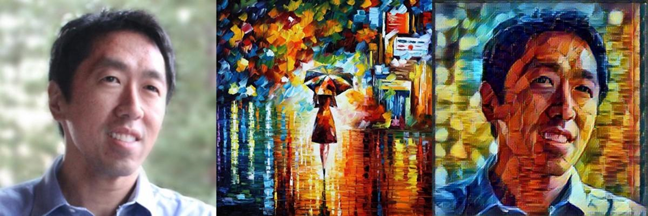

The flow chart below, briefly describes the procedures we are going to go through in this project.
To successfully reach the desired potrait result, there are two essential models need to be mentioned.

We employ Material Optimal Descriptor Network (MODNet), which is a light-weight matting objective decomposition network that can process portrait matting from a single input image in real time, to remove the background information of the picture. The background information in the portrait picture can be huge distraction and difficulty for us to pick a relatively consistent weights and layers that can be applied on most portrait images.

On the other hand, a well-known pretrained convolution neural network (CNN), VGG19, is used to extract features from both content image and style image. It is particularly important in the processes later on, because it can help us to actually transfer the style by definig a loss function to minimize the differences between the feature of out content, style and target images.







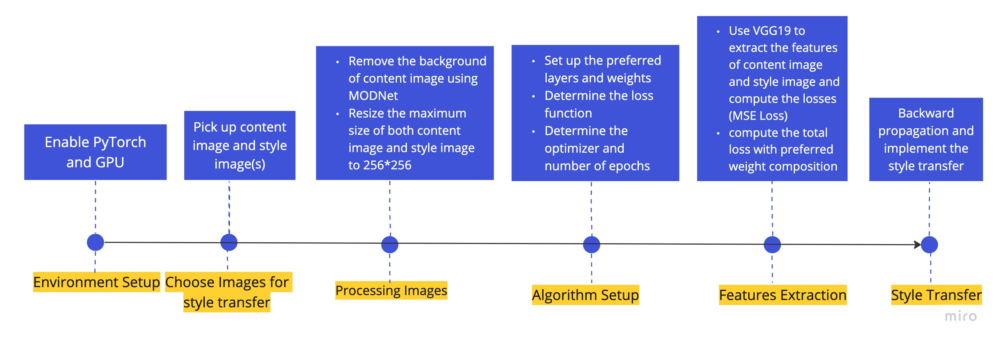

Even though it is known that nerual style transfer can be applied on many types of content images, we are motivated by the unique human-centered characteristic that portrait image carries. 

It not only gives us the opportunity of taking a deeper dive into manipulating the nuances of weights, layers and picture background to reach a relatively stable hyperparameter choice by eliminating overwhelming number of choices of types of content images, but also has the potential to encourage more people to apply nueral style stransfer this technique from simply appreciating it. The curiosity of seeing self-portrait in different styles and nature of sharing, will help pepople engage more on using this technique and sharing the results in many scenes, such as social platforms, family gathering, and festival events. Neural style stransfer on portrait can be applied on all these scenes and reach a positive outcome by increasing the social interactions.

## Step1: Import packages:

In [ ]:
!git clone https://github.com/thiagoambiel/PortraitStylization.git
%cd /content/PortraitStylization

Cloning into 'PortraitStylization'...
remote: Enumerating objects: 177, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 177 (delta 16), reused 4 (delta 4), pack-reused 154
Receiving objects: 100% (177/177), 70.56 MiB | 27.82 MiB/s, done.
Resolving deltas: 100% (65/65), done.
/content/PortraitStylization


Here we import the github files for the BackgroundRemoval package. 

In [ ]:
%cd /content/PortraitStylization

/content/PortraitStylization


In [ ]:
####################
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 831.4 MB 15 kB/s 
     |████████████████████████████████| 15.4 MB 71.1 MB/s 
     |████████████████████████████████| 1.9 MB 29.5 MB/s 
     |████████████████████████████████| 22.1 MB 1.5 MB/s 
     |████████████████████████████████| 1.6 MB 42.2 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.13.0+cu116
    Uninstalling torch-1.13.0+cu116:
      Successfully uninstalled torch-1.13.0+cu116
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.0+cu116
    Uninstalling torchvision-0.14.0+cu116:
      Successfully uninstalled torchvision-0.14.0+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are i

In [ ]:
%reload_ext autoreload
%autoreload

import io
from torch import nn

import torch
import numpy as np
import torch.optim as optim
from torchvision import transforms, models

from PIL import Image, ImageColor
import matplotlib.pyplot as plt

from ipywidgets import widgets, interact
from IPython.core.display import display, HTML

#from style_transfer import StyleTransfer
from remove_bg import BackgroundRemoval

## Step2: Model construction:
Here we use the "features" portion of VGG19 as our style transfer method. It is noted that we want our weights fixed in our model, so we stop updating the current parameters.

In [ ]:
vgg = models.vgg19(pretrained=True).features

#stop updating the current parameters
for param in vgg.parameters():
    param.requires_grad_(False)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

In [ ]:
# we move the model to GPU, if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# the vgg19 structure is displayed below
vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

We first build functions `load_image`, `load_image_uploader`, which could help us load the images we need.

In [ ]:
def load_image(img_path, shape=None):
    ''' Load in and transform an image, making sure the image
       is <= 256 pixels in the x-y dims.'''
    
    image = Image.open(img_path).convert('RGB')
    
    # large images will slow down processing
    if max(image.size) > 256:
        size = 256
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape
        
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image.to(device)

In [ ]:
def load_image_uploader(image):
    ''' Load in and transform an image, making sure the image
       is <= 256 pixels in the x-y dims.'''
    
    image = image.convert('RGB')
    
    # large images will slow down processing
    if max(image.size) > 256:
        size = 256
    else:
        size = max(image.size)
        
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image.to(device)

Then we loaded the content images and three style images.

In [ ]:
!wget https://oceanmhs.org/wp-content/uploads/2018/01/starrynight.jpg #download style1

--2022-12-09 01:08:12--  https://oceanmhs.org/wp-content/uploads/2018/01/starrynight.jpg
Resolving oceanmhs.org (oceanmhs.org)... 104.155.134.146
Connecting to oceanmhs.org (oceanmhs.org)|104.155.134.146|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 92567 (90K) [image/jpeg]
Saving to: ‘starrynight.jpg.1’

starrynight.jpg.1   100%[===================>]  90.40K  --.-KB/s    in 0.08s   

2022-12-09 01:08:12 (1.10 MB/s) - ‘starrynight.jpg.1’ saved [92567/92567]



In [ ]:
class ImageUploader:
  def __init__(self):
  
    self.data = []

    self.output = widgets.Output()
    self.uploader = widgets.FileUpload()


  def save(self, _):
    with self.output:

      for name, file_info in self.uploader.value.items():
        img = Image.open(io.BytesIO(file_info['content']))
        self.data.append(img)

  def run(self):
    display(self.output, self.uploader)
    self.uploader.observe(self.save, names='_counter')

In [ ]:
content_uploader = ImageUploader()
content_uploader.run()

Output()

FileUpload(value={}, description='Upload')

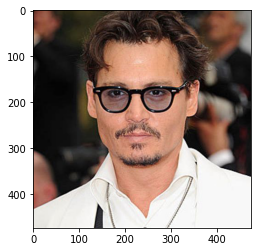

In [ ]:
plt.imshow(content_uploader.data[0])

In [ ]:
# try vgg19 without background removal
content_image = content_uploader.data[0]

Here we use the render function and the background removeal package to isolate the portrait and replace the background information with black color

In [ ]:
original_image = content_uploader.data[0]

def render(bgcolor, fgcolor, fg_fac, bt_fac, image):

    result = background_removal.remove_background(
        img=image,
        alpha=alpha,
        bg_color=bgcolor,
        bt_fac=bt_fac,
        fg_color=fgcolor,
        fg_fac=fg_fac
    )

    result_data.clear()
    result_data.insert(0, result)


background_removal = BackgroundRemoval(weights_path="./weights/modnet.pth", device=device)
alpha = background_removal.gen_alpha(np.array(original_image))

result_data = []

render(
  bgcolor='#000000', 
  fgcolor='#ffffff', 
  fg_fac=0, #ForeFac 0-1
  bt_fac=1,  #TextureFac 0-1
  image = original_image
  )

content_image = result_data[0]

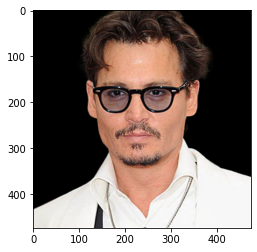

In [ ]:
plt.imshow(content_image)

In [ ]:
content = load_image_uploader(content_image)
original = load_image_uploader(original_image)

In [ ]:
# Resize style images to match content
style_starry = load_image('starrynight.jpg', shape=content.shape[-2:]).to(device)

In [ ]:
style_leaf = load_image('style_leaf.jpg', shape=content.shape[-2:]).to(device)

In [ ]:
style_marble = load_image('style_marble.jpg', shape=content.shape[-2:]).to(device)

In [ ]:
style_pattern5 = load_image('style_pattern5.jpg', shape=content.shape[-2:]).to(device)

Now we will double check the shape of content and style image.

In [ ]:
print(content.shape, style_starry.shape)

torch.Size([1, 3, 256, 256]) torch.Size([1, 3, 256, 256])


In [ ]:
# helper function for un-normalizing an image 
# and converting it from a Tensor image to a NumPy image for display
def im_convert(tensor):
    """ Display a tensor as an image. """
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

After converting the images, now we will display the images.

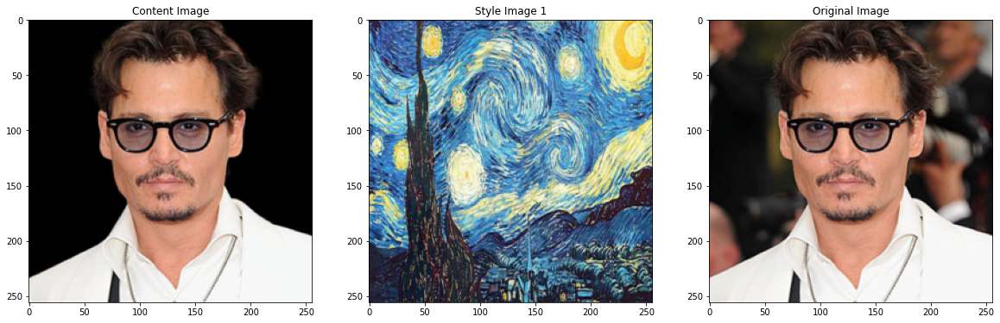

In [ ]:
# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))
# content and style ims side-by-side
ax1.imshow(im_convert(content))
ax1.set_title("Content Image")
ax2.imshow(im_convert(style_starry))
ax2.set_title("Style Image 1")
ax3.imshow(im_convert(original))
ax3.set_title("Original Image")

plt.show()


Here we specify the content layer and style layers in the get_features function. The reasons for us to choose these layers to as content and style representations can be found out in the summary   

In [ ]:
def get_features(image, model, layers=None):
    """ Run an image forward through a model and get the features for 
        a set of layers. Default layers are for VGGNet matching Gatys et al (2016)
    """
        ## Need the layers for the content and style representations of an image
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1', 
                  '10': 'conv3_1', 
                  '19': 'conv4_1',
                  '25': 'conv4_2',  ## content representation
                  '28': 'conv5_1'}
        
    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

In [ ]:
style_layers, content_layers = [0, 5, 10, 19, 28], [25]

In [ ]:
#reference: https://blog.csdn.net/qq_39906884/article/details/124658508
def extract_features(X, content_layers, style_layers):
    contents = []
    styles = []
    for i in range(len(vgg)):
        X = vgg[i](X)
        if i in style_layers:
            styles.append(X)
        if i in content_layers:
            contents.append(X)
    return contents, styles

In [ ]:
contents_Y = extract_features(content, content_layers, style_layers)[0]

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


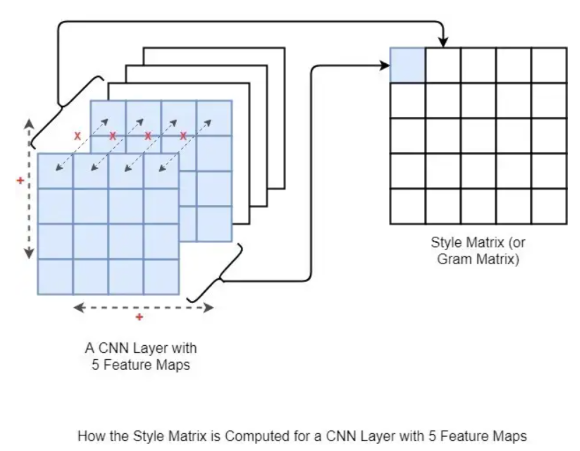

The idea of gram matrix, also style matrix, is to compute a element-wise inner product matrix of feature maps in a given layer in CNN, to capture the “distribution of features”, which can be used to efficently compute loss later on.

In [ ]:
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor 
        Gram Matrix: https://en.wikipedia.org/wiki/Gramian_matrix
    """
    
    # get the batch_size, depth, height, and width of the Tensor
    _, d, h, w = tensor.size()
    
    # reshape so we're multiplying the features for each channel
    tensor = tensor.view(d, h * w)
    
    # calculate the gram matrix
    gram = torch.mm(tensor, tensor.t())
    
    return gram 


In [ ]:
def style_transfer(content, style, vgg, sw1, sw2, sw3, sw4, sw5, style_weight, epochs):
#####################################################################1
  # get content and style features only once before training
  content_features = get_features(content, vgg)
  style_features = get_features(style, vgg)

# calculate the gram matrices for each layer of our style representation
  style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# create a third "target" image and prep it for change
# it is a good idea to start of with the target as a copy of our *content* image
# then iteratively change its style

#-----------------------
# changed
# changed our input. add some noise on our input image.


  target = content.clone().to(device)
  random_img = torch.randn(content.data.size()).cuda()
  target = 0.6 * target + 0.4 * random_img

  target.requires_grad_(True)

#########################################################################2

  style_weights = {'conv1_1': sw1,
                 'conv2_1': sw2,
                 'conv3_1': sw3,
                 'conv4_1': sw4,
                 'conv5_1': sw5}

  content_weight = 1  # alpha
  style_weight = style_weight  # beta

##########################################################################3
# changed 
# changed show_every, lr in optimizer, num_epochs
# changed the way computing content loss
# changed the calcuation method on style loss (changed to MSEloss)
# changed the way add content loss and style loss

# for displaying the target image, intermittently
  show_every = 1000

# iteration hyperparameters
  optimizer = optim.Adam([target], lr=0.003)
  num_epochs = epochs  # decide how many iterations to update your image (5000)

  for ii in range(1, num_epochs+1):
    
    #---------------------------------
    # get the features from your target image
      target_features = get_features(target, vgg)
    
    # the content loss
      contents_Y_hat, styles_Y_hat = extract_features(target, content_layers, style_layers)
      content_loss = [(torch.nn.MSELoss(reduction='mean')(Y_hat, Y.detach())) * content_weight for Y_hat, Y in zip(contents_Y_hat, contents_Y)]
    #---------------------------------



    # the style loss
    # initialize the style loss to 0
      style_loss = 0
    # then add to it for each layer's gram matrix loss
      for layer in style_weights:
        # get the "target" style representation for the layer
          target_feature = target_features[layer]
          target_gram = gram_matrix(target_feature)
          _, d, h, w = target_feature.shape
        # get the "style" style representation
          style_gram = style_grams[layer]
        # the style loss for one layer, weighted appropriately

        #---------------------------------
          layer_style_loss = style_weights[layer] * (torch.nn.MSELoss(reduction='mean')(target_gram, style_gram))
        #---------------------------------

        # add to the style loss
          style_loss += layer_style_loss / (d * h * w)
 
        
    # calculate the *total* loss
    #---------------------------------
      total_loss = content_loss[0] + style_weight * style_loss
    #---------------------------------

    # update your target image
    
      total_loss.backward()
      optimizer.step()
      optimizer.zero_grad()
    
    
    
    # display intermediate images and print the loss
      if  ii % show_every == 0:
          print('epoch: ',ii, "Total loss: ", total_loss.item())
          plt.imshow(im_convert(target))
          plt.show()


## Step3: First style transfer

In [ ]:
#@markdown Adjust Weights for Better Results.

#@markdown Weights for each style layer
first_layer = 0.7 #@param {type: "slider", min: 0.0, max: 1.0, step: 0.1}
second_layer = 0.5 #@param {type: "slider", min: 0.0, max: 1.0, step: 0.1}
third_layer = 0.2 #@param {type: "slider", min: 0.0, max: 1.0, step: 0.1}
fourth_layer = 0.3 #@param {type: "slider", min: 0.0, max: 1.0, step: 0.1}
fifth_layer = 0.1 #@param {type: "slider", min: 0.0, max: 1.0, step: 0.1}

#@markdown Overall weight of style iamge
style_weight = 1000 #@param {type: "number"}

#@markdown number of training epochs
epochs = 7000 #@param {type: "slider", min: 5000, max: 12000, step: 1000}





epoch:  1000 Total loss:  3257.402587890625


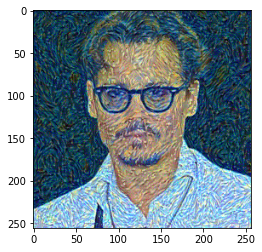

epoch:  2000 Total loss:  1357.0587158203125


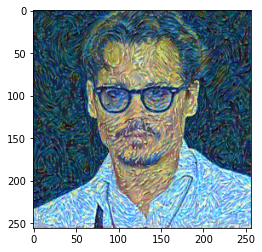

epoch:  3000 Total loss:  794.5180053710938


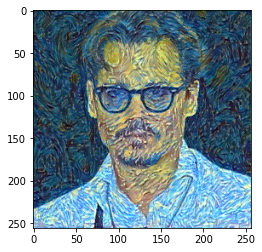

epoch:  4000 Total loss:  522.7044067382812


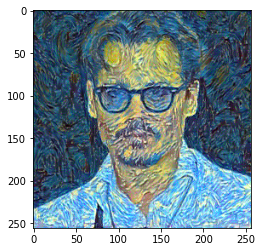

epoch:  5000 Total loss:  361.142578125


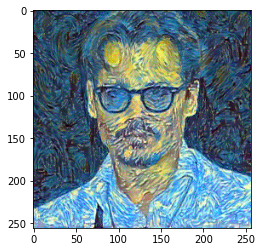

epoch:  6000 Total loss:  258.5837707519531


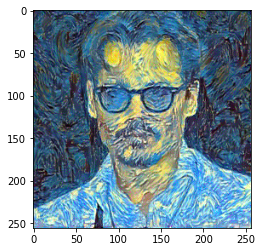

epoch:  7000 Total loss:  192.97348022460938


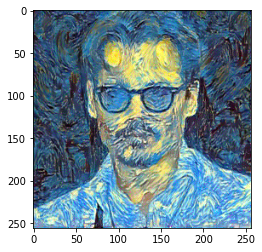

In [ ]:
style_transfer(content, style_starry, vgg,first_layer, second_layer, third_layer, fourth_layer, fifth_layer, style_weight, epochs)

## Step4: Try different style images

epoch:  1000 Total loss:  16700.662109375


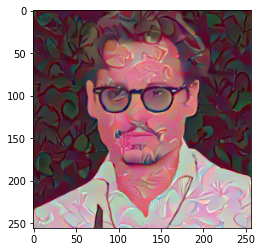

epoch:  2000 Total loss:  6425.03662109375


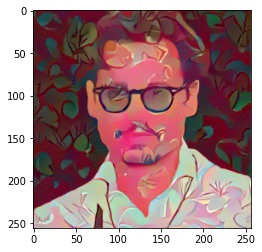

epoch:  3000 Total loss:  3648.533203125


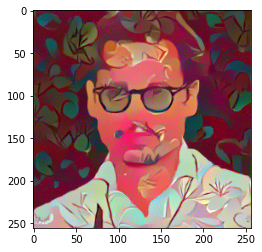

epoch:  4000 Total loss:  2421.3974609375


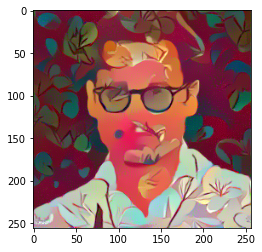

epoch:  5000 Total loss:  1799.7880859375


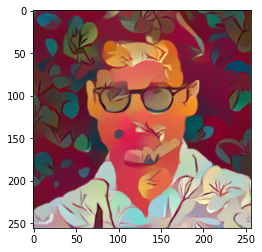

epoch:  6000 Total loss:  1432.0611572265625


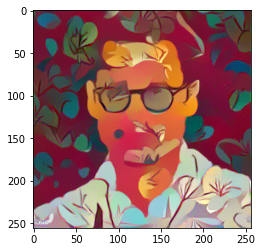

epoch:  7000 Total loss:  1191.3040771484375


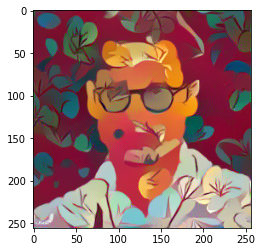

In [ ]:
style_transfer(content, style_leaf, vgg,first_layer, second_layer, third_layer, fourth_layer, fifth_layer, style_weight, epochs)

epoch:  1000 Total loss:  18737.29296875


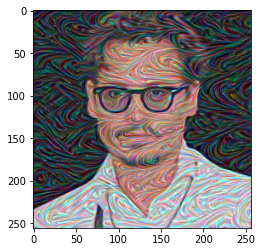

epoch:  2000 Total loss:  7027.927734375


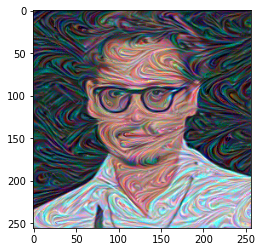

epoch:  3000 Total loss:  4136.36328125


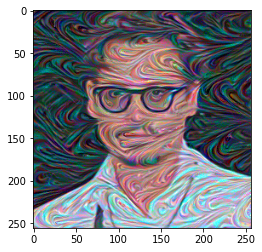

epoch:  4000 Total loss:  2840.376220703125


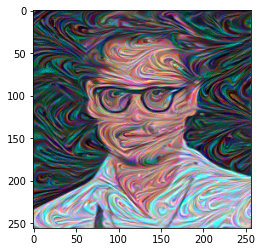

epoch:  5000 Total loss:  2077.7529296875


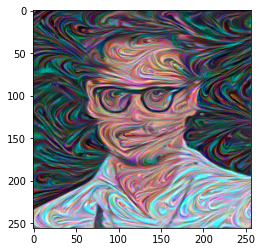

epoch:  6000 Total loss:  1569.6038818359375


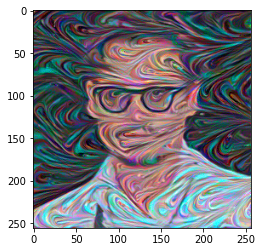

epoch:  7000 Total loss:  1214.3482666015625


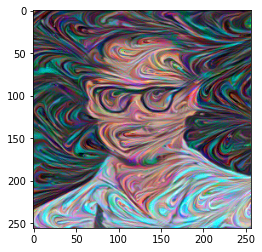

In [ ]:
style_transfer(content, style_marble, vgg,first_layer, second_layer, third_layer, fourth_layer, fifth_layer, style_weight, epochs)

epoch:  1000 Total loss:  7876.4384765625


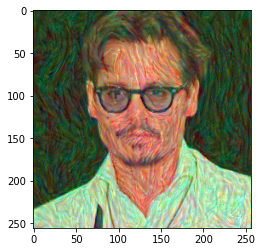

epoch:  2000 Total loss:  2357.036865234375


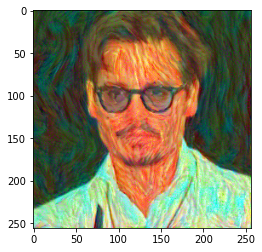

epoch:  3000 Total loss:  1191.1929931640625


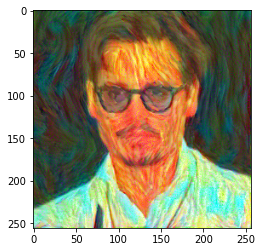

epoch:  4000 Total loss:  764.3951416015625


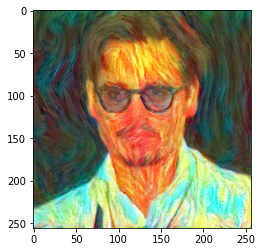

epoch:  5000 Total loss:  553.4884033203125


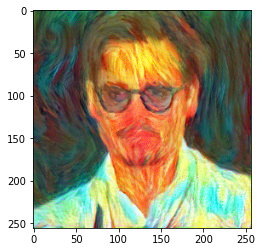

epoch:  6000 Total loss:  412.4774169921875


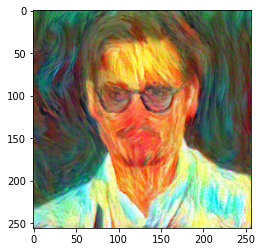

epoch:  7000 Total loss:  309.0185241699219


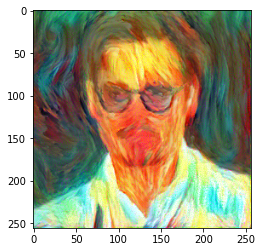

In [ ]:
style_transfer(content, style_pattern5, vgg,first_layer, second_layer, third_layer, fourth_layer, fifth_layer, style_weight, epochs)

## Step 5: Compare vgg without background removal and vgg with background removal

epoch:  1000 Total loss:  2297.051513671875


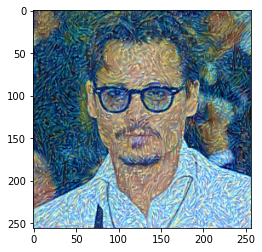

epoch:  2000 Total loss:  1067.54150390625


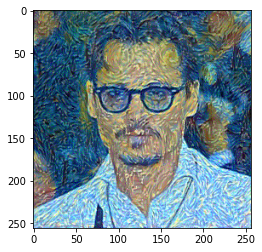

epoch:  3000 Total loss:  688.2703857421875


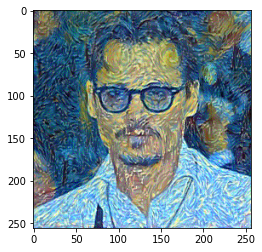

epoch:  4000 Total loss:  483.4753723144531


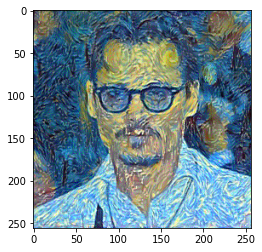

epoch:  5000 Total loss:  349.56085205078125


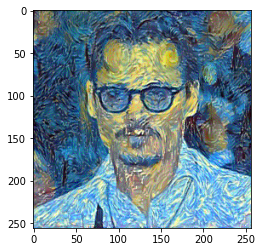

epoch:  6000 Total loss:  254.6893310546875


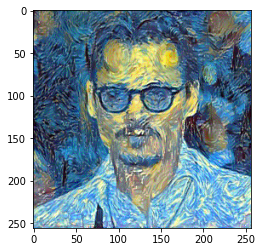

epoch:  7000 Total loss:  192.5242462158203


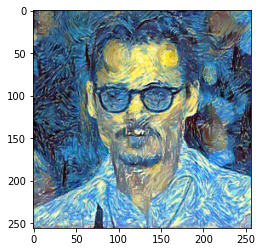

In [ ]:
style_transfer(original, style_starry, vgg,first_layer, second_layer, third_layer, fourth_layer, fifth_layer, style_weight, epochs)

epoch:  1000 Total loss:  19641.880859375


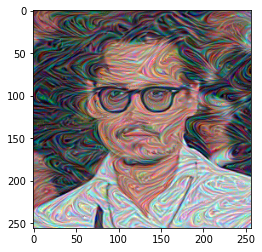

epoch:  2000 Total loss:  6874.798828125


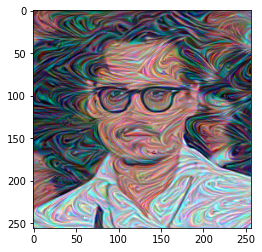

epoch:  3000 Total loss:  3949.845703125


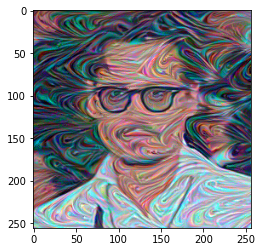

epoch:  4000 Total loss:  2710.892822265625


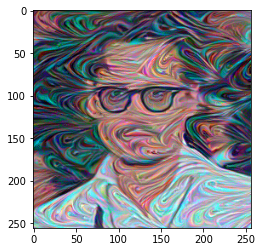

epoch:  5000 Total loss:  2010.8826904296875


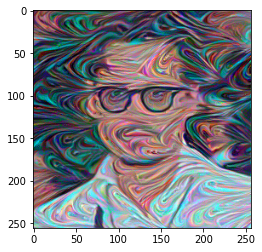

epoch:  6000 Total loss:  1554.3065185546875


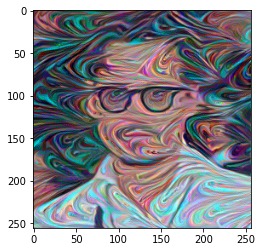

epoch:  7000 Total loss:  1238.93359375


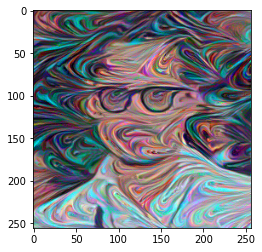

In [ ]:
style_transfer(original, style_marble, vgg,first_layer, second_layer, third_layer, fourth_layer, fifth_layer, style_weight, epochs)

## Step 6: Test new data

The model has been tuned with hyper-parameters to get the best performance.  Now it can be tested by uploading new content image and style image. 

In [ ]:
# load test content image
content_test_uploader = ImageUploader()
content_test_uploader.run()

Output()

FileUpload(value={}, description='Upload')

In [ ]:
# load test style image
style_test_uploader = ImageUploader()
style_test_uploader.run()

Output()

FileUpload(value={}, description='Upload')

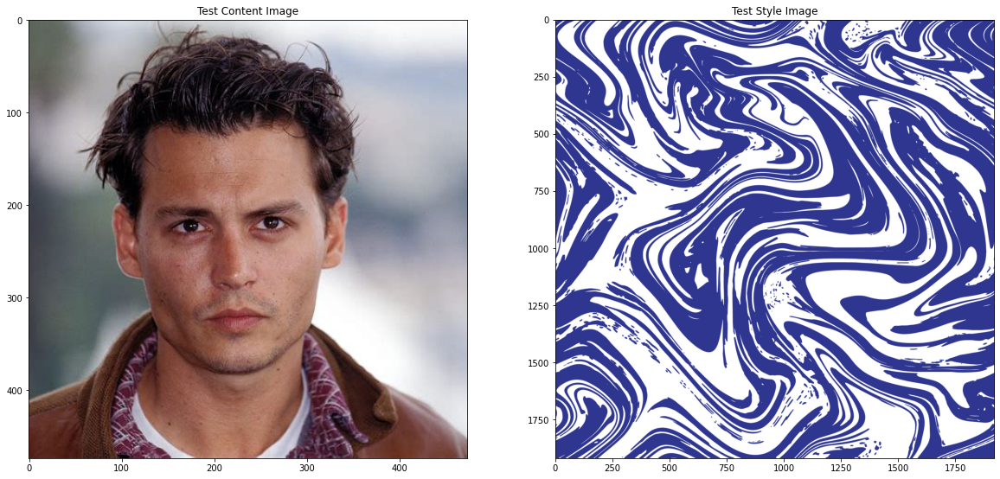

In [ ]:
# check uploaded images

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))
# content and style ims side-by-side
ax1.imshow(content_test_uploader.data[0])
ax1.set_title("Test Content Image")
ax2.imshow(style_test_uploader.data[0])
ax2.set_title("Test Style Image")

plt.show()

Text(0.5, 1.0, 'Content Image with Background Removal')

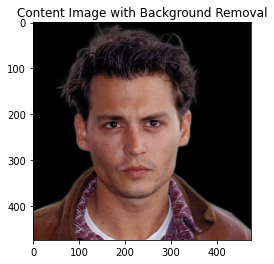

In [ ]:
#remove test content image background
content_test_image = content_test_uploader.data[0]
style_test_image = style_test_uploader.data[0]

background_removal = BackgroundRemoval(weights_path="./weights/modnet.pth", device=device)
alpha = background_removal.gen_alpha(np.array(content_test_image))

result_data = []

render(
  bgcolor='#000000', 
  fgcolor='#ffffff', 
  fg_fac=0,
  bt_fac=1,
  image = content_test_image
  )

content_test_image = result_data[0]

#check the test content image with background removal
plt.imshow(content_test_image)
plt.title("Content Image with Background Removal")

epoch:  1000 Total loss:  155808.046875


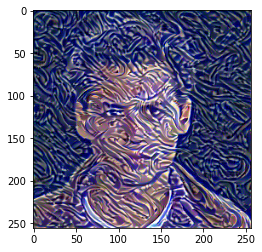

epoch:  2000 Total loss:  55867.53515625


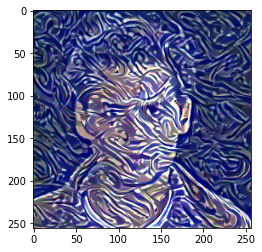

epoch:  3000 Total loss:  26276.76171875


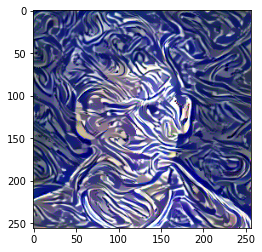

epoch:  4000 Total loss:  14021.0166015625


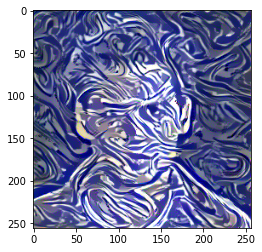

epoch:  5000 Total loss:  8177.10302734375


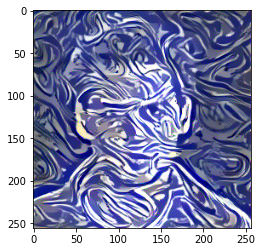

epoch:  6000 Total loss:  5142.89794921875


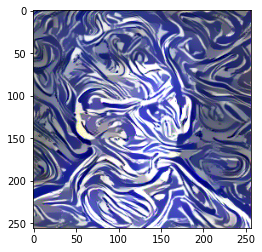

epoch:  7000 Total loss:  3542.568359375


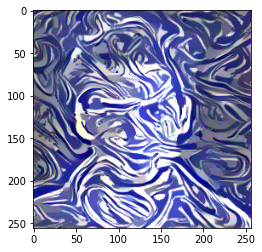

In [ ]:
# plot result of test images

content = load_image_uploader(content_test_image)
style = load_image_uploader(style_test_image)

contents_Y = extract_features(content, content_layers, style_layers)[0]

style_transfer(content, style, vgg,first_layer, second_layer, third_layer, fourth_layer, fifth_layer, style_weight, epochs)

## Summary


Based on both training outputs and test outputs above, we can see that the target images combine the content features and style features well, indicating that the model can successfully apply styles of famous paintings to your own selfie, and get entertaining and visually pleasing results. 

After number of tryies in testing target images, it reveals that our choice of removing background information, content layer, style layers, style weights, content weight and loss composition are reasonable for this model.

After comparing the background-removed target image and non-background-removed image, we realize that the noisy background imformation of the content image, after neural style transfer, would often be distorted and loses its original meaning since the arrangements of the background information is hard to capture while the content image is mainly made up by portrait. 

For choosing the conent layer, we realize the lower the layer level, the generated image tends to have a more aligned match with the content image. Since our purpose is to have a target image that just has the general arrangements of human portrait in content image, we choose the conv4_2.

On the other hand, because we wanna transfer both the global visual styles and texture details from style image, the choices of style layers are generally distrbuted over the whole VGG19 as the first layer of each group of CNN layers.(conv1_1, conv2_1, conv3_1, conv4_1, conv5_1)

One of the most important parts of hyperparameters tuning in this project is the style weights. More weights on lower style layers can cause larger style artifacts in the target image. More emphasis on feature details when more weights on higher style layers. We decide to have bigger sum of wieghts in lower style layers, because we discover that the facial expression of the portrait can be blurred by too many weights on the higher style layers.

The total loss is the sum of weighted content loss and style loss, After tuning, the content loss's weight is simply set as 1, to make sure the general arrangements of human portrait is kept, while style loss's weight is set to be 1000 to sufficiently transfer the visual style.

##Discussion

The model only did a good job combining the styles of landscape and still life painting, it is hard to transfer the styles of the head portrait painting to the real selfie images with exactly same facial layuts on each object, such as eyes and mouth. 

To achieve this goal, we need more complex models to extract feaures, such as 3D facial mesh model, and more flexible control of the features of content and style, such as using object detection to individually work on each part of the portrait. 

If these approaches above are achieved, there are also possiblity for us to extend the approach of style transfer, such as blend different styles in to one content image. Specifically, we can separate objects on content image into different categories, and transfer different style to each category.

On the other hand, the output results above are mostly capturing the general information of the style information, and that's why the original color on the content image is "washed away" and is relaced by style image's color after a few thousand epochs. There is still much to explore on models that can ignore the color of style image, but only capture the essence of the style image, like the pattern and the shape of lines. In that way, output result would not only have the transferred style, but also maintain the original color. However, this idea may require enormous computing resources since it's more like a pixel to pixel operation.  

These all can be the possible future improvements for this project.

## Reference:
1.  https://www.kaggle.com/code/soumya044/artistic-neural-style-transfer-using-pytorch

2. https://blog.csdn.net/qq_39906884/article/details/124658508

3. https://towardsdatascience.com/light-on-math-machine-learning-intuitive-guide-to-neural-style-transfer-ef88e46697ee

4. https://modnet.readthedocs.io/en/latest/

5. https://towardsdatascience.com/how-to-get-beautiful-results-with-neural-style-transfer-75d0c05d6489

6. https://towardsdatascience.com/practical-techniques-for-getting-style-transfer-to-work-19884a0d69eb

7. https://github.com/thiagoambiel/PortraitStylization

In [ ]:
%%shell
jupyter nbconvert --to html /content/Team_17_Project_Walkthrough.ipynb

[NbConvertApp] Converting notebook /content/final_Project_Progress_Report_Team_17.ipynb to html
[NbConvertApp] Writing 7101334 bytes to /content/final_Project_Progress_Report_Team_17.html
